In [1]:
#================================================================
# CELL 1: CONFIG — EVALUATION ONLY NOTEBOOK
#================================================================
import os, random, numpy as np, torch
from pathlib import Path
import yaml

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED); torch.backends.cudnn.deterministic = True
os.environ['PYTHONHASHSEED'] = str(SEED)
print(f'All seeds fixed to {SEED}')

# ==========================================
# AUTO-FIND PATHS
# ==========================================

# Cotton path
COTTON = Path('/kaggle/input/datasets/jawadulkarim117/cotton-weed-12-class/cotton_weed')
if not COTTON.exists():
    for p in Path('/kaggle/input').rglob('cotton_weed'):
        if p.is_dir():
            COTTON = p
            break
print(f"Cotton: {COTTON} (exists: {COTTON.exists()})")

# MH-Weed path
MHWEED = None
mh_base = Path('/kaggle/input/datasets/sayalis069/mh-weed16')
if mh_base.exists():
    for p in mh_base.rglob('*'):
        if p.is_dir() and p.name == 'MH-Weed16':
            MHWEED = p
            break
    if MHWEED is None:
        for p in mh_base.iterdir():
            if p.is_dir():
                MHWEED = p
                break
if MHWEED is None:
    MHWEED = mh_base
print(f"MHWeed: {MHWEED} (exists: {MHWEED.exists()})")

# Teacher weights (your existing dataset)
TEACHER_WEIGHTS = None
for base in ['/kaggle/input/datasets/rushikolla', '/kaggle/input']:
    for p in Path(base).rglob('best.pt'):
        if 'teacher' in str(p).lower():
            TEACHER_WEIGHTS = str(p)
            break
    if TEACHER_WEIGHTS:
        break
if TEACHER_WEIGHTS is None:
    TEACHER_WEIGHTS = 'yolov8l.pt'
print(f"Teacher: {TEACHER_WEIGHTS}")

# ==========================================
# KD STUDENT — load from your uploaded dataset
# ==========================================
# Auto-search for best_kd_student.pt in all input datasets
KD_STUDENT_WEIGHTS = None
for p in Path('/kaggle/input').rglob('best_kd_student.pt'):
    KD_STUDENT_WEIGHTS = str(p)
    break

if KD_STUDENT_WEIGHTS is None:
    raise FileNotFoundError(
        "best_kd_student.pt not found!\n"
        "Please upload it to a Kaggle dataset and add it to this notebook.\n"
        "Expected path: /kaggle/input/<your-dataset-name>/best_kd_student.pt"
    )
print(f"KD Student: {KD_STUDENT_WEIGHTS} ✅")

# ==========================================
# CONFIG
# ==========================================
CFG = {
    # DATA PATHS
    'cotton_path':      str(COTTON.parent),
    'mhweed_path':      str(MHWEED),
    'work_dir':         '/kaggle/working',

    # MODELS
    'teacher_weights':  TEACHER_WEIGHTS,
    'student_weights':  KD_STUDENT_WEIGHTS,   # ← your KD model
    'kd_weights':       KD_STUDENT_WEIGHTS,   # ← same, explicit

    # FIXED — matches your training
    'nc':               19,

    # IMAGE/BATCH
    'img_size':         640,
    'batch_size':       16,
    'num_workers':      4,

    # NOT USED IN EVAL — kept for compatibility
    'teacher_epochs':   80,
    'teacher_lr':       1e-4,
    'kd_epochs':        80,
    'kd_lr':            1e-4,
    'weight_decay':     1e-4,
    'temperature':      3.0,
    'alpha':            0.7,
    'beta':             0.3,
    'gamma':            0.0,
    'msad_threshold':   0.75,
    'low_ap_warn':      0.50,
    'check_every':      10,
    'patience':         30,
    'save_every':       10,
}

assert abs(CFG['alpha'] + CFG['beta'] + CFG['gamma'] - 1.0) < 1e-6, \
    'alpha+beta+gamma must = 1.0'

# ==========================================
# PATHS
# ==========================================
WORK      = Path(CFG['work_dir'])
OUTPUT    = WORK / 'outputs'
MERGED    = WORK / 'merged'
YAML_PATH = MERGED / 'data.yaml'
BEST_KD   = Path(KD_STUDENT_WEIGHTS)   # ← used in Cell 17

OUTPUT.mkdir(parents=True, exist_ok=True)

# ==========================================
# VERIFY
# ==========================================
assert COTTON.exists(),   f'Cotton not found:     {COTTON}'
assert MHWEED.exists(),   f'MHWeed not found:     {MHWEED}'
assert BEST_KD.exists(),  f'KD model not found:   {BEST_KD}'

yaml.dump(CFG, open(OUTPUT / 'config.yaml', 'w'))

print(f'\n✅ All paths found!')
print(f'  COTTON:     {COTTON}')
print(f'  MHWEED:     {MHWEED}')
print(f'  OUTPUT:     {OUTPUT}')
print(f'  MERGED:     {MERGED}  ← will be built in next cells')
print(f'  Teacher:    {CFG["teacher_weights"]}')
print(f'  KD Student: {CFG["kd_weights"]}')
print(f'  nc={CFG["nc"]}, img={CFG["img_size"]}, batch={CFG["batch_size"]}')
print(f'\n⚠️  MERGED folder not yet built — run Cells 2-6 to rebuild dataset')
print(f'   Then run Cell 17 for quantization + evaluation')


All seeds fixed to 42
Cotton: /kaggle/input/datasets/jawadulkarim117/cotton-weed-12-class/cotton_weed (exists: True)
MHWeed: /kaggle/input/datasets/sayalis069/mh-weed16/MH-Weed16An Indian Multiclass Annotated Weed Dataset for Computer Vision Tasks/MH-Weed16 (exists: True)
Teacher: /kaggle/input/datasets/rahu12345/teacher/best.pt
KD Student: /kaggle/input/datasets/rahu12345/kd-student-weed/best_kd_student.pt ✅

✅ All paths found!
  COTTON:     /kaggle/input/datasets/jawadulkarim117/cotton-weed-12-class/cotton_weed
  MHWEED:     /kaggle/input/datasets/sayalis069/mh-weed16/MH-Weed16An Indian Multiclass Annotated Weed Dataset for Computer Vision Tasks/MH-Weed16
  OUTPUT:     /kaggle/working/outputs
  MERGED:     /kaggle/working/merged  ← will be built in next cells
  Teacher:    /kaggle/input/datasets/rahu12345/teacher/best.pt
  KD Student: /kaggle/input/datasets/rahu12345/kd-student-weed/best_kd_student.pt
  nc=19, img=640, batch=16

⚠️  MERGED folder not yet built — run Cells 2-6 to rebu

In [2]:
# ================================================================
# CELL 2 (STABLE): IMPORTS + GLOBALS
# ================================================================
# If imports fail, THEN install minimal packages.
# Prefer using Kaggle preinstalled env to avoid numpy/scipy breakage.

import os, re, gc, math, json, time, random, shutil, logging
from pathlib import Path
from collections import Counter, defaultdict

import cv2
import yaml
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

# Try import first (no pip by default)
try:
    import albumentations as A
    from albumentations.pytorch import ToTensorV2
except Exception:
    !pip -q install --no-deps albumentations==1.4.18
    import albumentations as A
    from albumentations.pytorch import ToTensorV2

try:
    import ultralytics
    from ultralytics import YOLO
except Exception:
    !pip -q install --no-deps ultralytics==8.4.21
    import ultralytics
    from ultralytics import YOLO

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Device:", device)
print("numpy:", np.__version__)
print("torch:", torch.__version__)
print("ultralytics:", ultralytics.__version__)
print("albumentations:", A.__version__)

# deterministic-ish
torch.backends.cudnn.benchmark = True
torch.backends.cudnn.deterministic = False

WORK   = Path(CFG['work_dir'])
OUTPUT = WORK / "outputs"
MERGED = WORK / "merged"
OUTPUT.mkdir(parents=True, exist_ok=True)

logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s | %(levelname)s | %(message)s',
    handlers=[logging.StreamHandler(), logging.FileHandler(OUTPUT / 'run.log')]
)
log = logging.getLogger("KD")
log.info("Bootstrap complete.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 17.3 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


2026-03-17 14:42:10,370 | INFO | Bootstrap complete.


Device: cuda
numpy: 2.0.2
torch: 2.9.0+cu126
ultralytics: 8.4.21
albumentations: 2.0.8


In [3]:
# ================================================================
# CELL 3 (REWRITE): CLASS DISCOVERY + UNIFICATION
# ================================================================
import re
from pathlib import Path

def clean_name(name: str) -> str:
    name = re.sub(r'^\d+\.+', '', name).strip()
    if '(' in name:
        name = name.split('(')[0].strip()
    name = name.replace('_', ' ')
    name = re.sub(r'\s+', ' ', name).strip().rstrip('.')
    return name.title()

# Cotton classes
cotton_yaml_path = Path(CFG['cotton_path']) / "data.yaml"
assert cotton_yaml_path.exists(), f"Missing cotton data.yaml: {cotton_yaml_path}"

with open(cotton_yaml_path, "r") as f:
    c_yaml = yaml.safe_load(f)

cotton_classes = c_yaml["names"]
if isinstance(cotton_classes, dict):
    cotton_classes = [cotton_classes[i] for i in range(len(cotton_classes))]
cotton_classes = [str(x).strip() for x in cotton_classes]

# MH-Weed classes from folders
mh_root = Path(CFG['mhweed_path'])
class_folder = mh_root / "Individual Weed Species" / "16 Classes of Weed_Species" / "Individual Weed_Species"
assert class_folder.exists(), f"MH class folder not found: {class_folder}"

mhweed_classes = []
for d in sorted(class_folder.iterdir()):
    if d.is_dir():
        n = clean_name(d.name)
        if n:
            mhweed_classes.append(n)

# keep Sicklepod from cotton distinct if duplicated
mhweed_classes = ["Sicklepod Mh" if c == "Sicklepod" else c for c in mhweed_classes]

MASTER = list(dict.fromkeys(cotton_classes + [c for c in mhweed_classes if c not in cotton_classes]))
NC = len(MASTER)

assert NC == 28, f"Expected 28 classes, got {NC}"

COTTON_REMAP = {i: MASTER.index(n) for i, n in enumerate(cotton_classes)}
MHWEED_REMAP = {i: MASTER.index(n) for i, n in enumerate(mhweed_classes)}

CFG["nc"] = NC

log.info(f"Cotton classes ({len(cotton_classes)}): {cotton_classes}")
log.info(f"MH-Weed classes ({len(mhweed_classes)}): {mhweed_classes}")
log.info(f"MASTER ({NC}): {MASTER}")
log.info(f"COTTON_REMAP: {COTTON_REMAP}")
log.info(f"MHWEED_REMAP: {MHWEED_REMAP}")

2026-03-17 14:42:10,413 | INFO | Cotton classes (12): ['Waterhemp', 'MorningGlory', 'Purslane', 'SpottedSpurge', 'Carpetweed', 'Ragweed', 'Eclipta', 'PricklySida', 'PalmerAmaranth', 'Sicklepod', 'Goosegrass', 'Cutleaf']
2026-03-17 14:42:10,414 | INFO | MH-Weed classes (16): ['Kena', 'Lavhala', 'Gajar Gavat', 'Graceful Sandmart', 'Sicklepod Mh', 'Harali', 'Dwarf Cassia', 'Punarnava', 'Lamber Quarter Plant', 'Little Mallow', 'Moti Dudhi', 'Obscure Morning Glory', 'Asian Pigeonwings', 'Bilayat', 'Choti Dudhi', 'Digitaria Sp']
2026-03-17 14:42:10,415 | INFO | MASTER (28): ['Waterhemp', 'MorningGlory', 'Purslane', 'SpottedSpurge', 'Carpetweed', 'Ragweed', 'Eclipta', 'PricklySida', 'PalmerAmaranth', 'Sicklepod', 'Goosegrass', 'Cutleaf', 'Kena', 'Lavhala', 'Gajar Gavat', 'Graceful Sandmart', 'Sicklepod Mh', 'Harali', 'Dwarf Cassia', 'Punarnava', 'Lamber Quarter Plant', 'Little Mallow', 'Moti Dudhi', 'Obscure Morning Glory', 'Asian Pigeonwings', 'Bilayat', 'Choti Dudhi', 'Digitaria Sp']
2026-0

In [4]:
#================================================================
# CELL 4: CLASS UNIFICATION (FIXED)
# IMPORTANT: Clean class names before building master list
#================================================================
# Clean MH-Weed class names (remove trailing _, fix spaces)
def clean_class_name(name):
    # Remove trailing underscore and spaces
    name = name.strip().rstrip('_')
    # Replace underscores with spaces for readability
    name = name.replace('_', ' ')
    # Capitalize first letter of each word
    name = ' '.join(word.capitalize() for word in name.split())
    return name

# Clean both class lists
cotton_classes_clean = cotton_classes  # Cotton names are already clean
mhweed_classes_clean = [clean_class_name(c) for c in mhweed_classes if c.strip()]

log.info(f'Cotton classes (clean): {cotton_classes_clean}')
log.info(f'MH Weed classes (clean): {mhweed_classes_clean}')

# Build master class list — duplicates removed, order preserved
MASTER = list(dict.fromkeys(
    cotton_classes_clean + [c for c in mhweed_classes_clean if c not in cotton_classes_clean]
))
NC = len(MASTER)

# Verify no empty classes
assert all(c.strip() for c in MASTER), "Empty class name found in MASTER list"
assert NC <= 28, f"Expected <=28 classes, got {NC}. Check for duplicates!"

log.info(f'Master class list ({NC} classes): {MASTER}')

# Update config with actual NC
CFG['nc'] = NC

# Remap dicts: original_id -> unified_id
COTTON_REMAP = {i: MASTER.index(c) for i, c in enumerate(cotton_classes_clean)}
MHWEED_REMAP = {i: MASTER.index(c) for i, c in enumerate(mhweed_classes_clean) if c in MASTER}

log.info(f'Cotton remap: {COTTON_REMAP}')
log.info(f'MH Weed remap: {MHWEED_REMAP}')

2026-03-17 14:42:10,436 | INFO | Cotton classes (clean): ['Waterhemp', 'MorningGlory', 'Purslane', 'SpottedSpurge', 'Carpetweed', 'Ragweed', 'Eclipta', 'PricklySida', 'PalmerAmaranth', 'Sicklepod', 'Goosegrass', 'Cutleaf']
2026-03-17 14:42:10,437 | INFO | MH Weed classes (clean): ['Kena', 'Lavhala', 'Gajar Gavat', 'Graceful Sandmart', 'Sicklepod Mh', 'Harali', 'Dwarf Cassia', 'Punarnava', 'Lamber Quarter Plant', 'Little Mallow', 'Moti Dudhi', 'Obscure Morning Glory', 'Asian Pigeonwings', 'Bilayat', 'Choti Dudhi', 'Digitaria Sp']
2026-03-17 14:42:10,439 | INFO | Master class list (28 classes): ['Waterhemp', 'MorningGlory', 'Purslane', 'SpottedSpurge', 'Carpetweed', 'Ragweed', 'Eclipta', 'PricklySida', 'PalmerAmaranth', 'Sicklepod', 'Goosegrass', 'Cutleaf', 'Kena', 'Lavhala', 'Gajar Gavat', 'Graceful Sandmart', 'Sicklepod Mh', 'Harali', 'Dwarf Cassia', 'Punarnava', 'Lamber Quarter Plant', 'Little Mallow', 'Moti Dudhi', 'Obscure Morning Glory', 'Asian Pigeonwings', 'Bilayat', 'Choti Dudhi

In [5]:
#================================================================
# CELL 5: MERGE WITH REAL BOUNDING BOXES — BUGFIXED
#================================================================
import shutil, random
from pathlib import Path
import yaml

print("="*60)
print("MERGING DATASETS WITH REAL BOUNDING BOXES")
print("="*60)

random.seed(SEED)

# Paths
COTTON = Path('/kaggle/input/datasets/jawadulkarim117/cotton-weed-12-class/cotton_weed')
DATA_ROOT = Path('/kaggle/input/datasets/sayalis069/mh-weed16/MH-Weed16An Indian Multiclass Annotated Weed Dataset for Computer Vision Tasks/MH-Weed16')
YOLO_LABELS = DATA_ROOT / 'Crop with Weeds' / 'intel Real Sense Depth_Annotations' / 'intel Real Sense Depth_Annotations' / 'YOLO_darknet'

MHWEED_IMG_DIRS = [
    DATA_ROOT / 'Crop with Weeds' / 'Canon Camera_Clicks' / 'Canon Camera_Clicks',
    DATA_ROOT / 'Crop with Weeds' / 'iPhone_Clicks' / 'iPhone_Clicks',
    DATA_ROOT / 'Crop with Weeds' / 'intel Real Sense Depth_Clicks' / 'intel Real Sense Depth_Clicks',
]

# ---- CRITICAL FIX 1: reset old merged data ----
if MERGED.exists():
    shutil.rmtree(MERGED)

for split in ['train', 'val', 'test']:
    (MERGED / split / 'images').mkdir(parents=True, exist_ok=True)
    (MERGED / split / 'labels').mkdir(parents=True, exist_ok=True)

print(f"COTTON path: {COTTON} (exists: {COTTON.exists()})")
print(f"YOLO labels: {len(list(YOLO_LABELS.glob('*.txt')))} files")

def valid_img_list(img_dir: Path):
    exts = ['*.jpg', '*.JPG', '*.jpeg', '*.JPEG', '*.png', '*.PNG']
    out = []
    for e in exts:
        out.extend(img_dir.glob(e))
    return out

def remap_label_lines(lines, remap_dict):
    mapped = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) != 5:
            continue
        old_cls = int(float(parts[0]))
        if old_cls not in remap_dict:
            continue
        x, y, w, h = map(float, parts[1:])
        if not (0.0 <= x <= 1.0 and 0.0 <= y <= 1.0 and 0.0 < w <= 1.0 and 0.0 < h <= 1.0):
            continue
        new_cls = remap_dict[old_cls]
        mapped.append(f"{new_cls} {x:.6f} {y:.6f} {w:.6f} {h:.6f}")
    return mapped

# 1) MERGE COTTON (strict image-label pairing)
def merge_cotton():
    count = 0
    for split_name, folder_name in [('train', 'train'), ('val', 'valid'), ('test', 'test')]:
        img_dir = COTTON / folder_name / 'images'
        lbl_dir = COTTON / folder_name / 'labels'
        if not img_dir.exists() or not lbl_dir.exists():
            print(f"⚠ Missing cotton split dirs for {split_name}")
            continue

        imgs = valid_img_list(img_dir)
        print(f"  Cotton {split_name}: {len(imgs)} raw images")

        kept = 0
        for img_path in imgs:
            lbl = lbl_dir / f'{img_path.stem}.txt'
            if not lbl.exists():
                continue

            lines = lbl.read_text().strip().splitlines()
            new_lines = remap_label_lines(lines, COTTON_REMAP)
            if len(new_lines) == 0:
                continue

            stem = f'c_{count:08d}'
            out_img = MERGED / split_name / 'images' / f'{stem}{img_path.suffix.lower()}'
            out_lbl = MERGED / split_name / 'labels' / f'{stem}.txt'

            shutil.copy2(img_path, out_img)
            out_lbl.write_text('\n'.join(new_lines))
            count += 1
            kept += 1

        print(f"    ✅ kept labeled: {kept}")
    return count

# 2) MERGE MH-WEED (only YOLO-labeled pairs)
def merge_mhweed_real():
    all_pairs = []
    for img_dir in MHWEED_IMG_DIRS:
        if not img_dir.exists():
            print(f"⚠ Not found: {img_dir}")
            continue

        images = valid_img_list(img_dir)
        matched = 0
        for img_path in images:
            lbl_path = YOLO_LABELS / f'{img_path.stem}.txt'
            if lbl_path.exists():
                all_pairs.append((img_path, lbl_path))
                matched += 1

        print(f"✅ {img_dir.name}: images={len(images)}, matched={matched}")

    if len(all_pairs) == 0:
        raise ValueError("No MH-Weed image-label pairs found.")

    random.shuffle(all_pairs)
    n = len(all_pairs)
    splits = {
        'train': all_pairs[:int(0.8*n)],
        'val':   all_pairs[int(0.8*n):int(0.9*n)],
        'test':  all_pairs[int(0.9*n):]
    }

    count = 0
    for split_name, pairs in splits.items():
        kept = 0
        for img_path, lbl_path in pairs:
            lines = lbl_path.read_text().strip().splitlines()
            new_lines = remap_label_lines(lines, MHWEED_REMAP)
            if len(new_lines) == 0:
                continue

            stem = f'm_{count:08d}'
            out_img = MERGED / split_name / 'images' / f'{stem}{img_path.suffix.lower()}'
            out_lbl = MERGED / split_name / 'labels' / f'{stem}.txt'

            shutil.copy2(img_path, out_img)
            out_lbl.write_text('\n'.join(new_lines))
            count += 1
            kept += 1

        print(f"  MH {split_name}: ✅ kept labeled {kept}")
    return count

# RUN
print("\n🔄 Merging Cotton...")
c_count = merge_cotton()
print(f"✅ Cotton kept: {c_count}")

print("\n🔄 Merging MH-Weed...")
m_count = merge_mhweed_real()
print(f"✅ MH-Weed kept: {m_count}")

total = c_count + m_count
print(f"\n{'='*60}")
print(f"📊 TOTAL kept labeled images: {total}")

# ---- CRITICAL FIX 2: enforce images == labels ----
for split in ['train', 'val', 'test']:
    n_img = len(list((MERGED / split / 'images').glob('*')))
    n_lbl = len(list((MERGED / split / 'labels').glob('*.txt')))
    print(f"  {split}: {n_img} images, {n_lbl} labels")
    assert n_img == n_lbl, f"{split} mismatch: {n_img} images vs {n_lbl} labels"

yaml.dump({
    'path': str(MERGED),
    'train': 'train/images',
    'val':   'val/images',
    'test':  'test/images',
    'nc':    NC,
    'names': {i: MASTER[i] for i in range(NC)}
}, open(MERGED / 'data.yaml', 'w'), default_flow_style=False)

print(f"\n✅ Ready: {NC} classes, {total} labeled images")

MERGING DATASETS WITH REAL BOUNDING BOXES
COTTON path: /kaggle/input/datasets/jawadulkarim117/cotton-weed-12-class/cotton_weed (exists: True)
YOLO labels: 6656 files

🔄 Merging Cotton...
  Cotton train: 12250 raw images
    ✅ kept labeled: 12249
  Cotton val: 1342 raw images
    ✅ kept labeled: 1342
  Cotton test: 2391 raw images
    ✅ kept labeled: 2391
✅ Cotton kept: 15982

🔄 Merging MH-Weed...
✅ Canon Camera_Clicks: images=345, matched=0
✅ iPhone_Clicks: images=576, matched=0
✅ intel Real Sense Depth_Clicks: images=6656, matched=6656
  MH train: ✅ kept labeled 5317
  MH val: ✅ kept labeled 665
  MH test: ✅ kept labeled 666
✅ MH-Weed kept: 6648

📊 TOTAL kept labeled images: 22630
  train: 17566 images, 17566 labels
  val: 2007 images, 2007 labels
  test: 3057 images, 3057 labels

✅ Ready: 28 classes, 22630 labeled images


In [6]:
# ================================================================
# CELL 5.5: MERGE RARE CLASSES (CRITICAL FOR 70+ mAP)
# ================================================================

from pathlib import Path
import yaml
from collections import Counter

print("="*70)
print("🔧 MERGING RARE CLASSES FOR BALANCE")
print("="*70)

# Load current data.yaml
with open(YAML_PATH, 'r') as f:
    data_cfg = yaml.safe_load(f)

# Count current distribution
print("Analyzing class distribution...")
class_counts = Counter()
for split in ['train', 'val']:
    label_dir = MERGED / split / 'labels'
    for txt_file in label_dir.glob('*.txt'):
        with open(txt_file) as f:
            for line in f:
                cls = int(line.split()[0])
                class_counts[cls] += 1

print("\nCurrent class distribution:")
for cls_id, count in sorted(class_counts.items()):
    status = "✅ Keep" if count >= 400 else "🔴 MERGE"
    print(f"  Class {cls_id}: {count:5d} images [{status}]")

# Define rare classes (< 400 images) - ADJUST THESE BASED ON YOUR COUNTS
# Based on your previous output, these were the rare ones:
RARE_CLASSES = [18, 19, 23, 25, 26, 27]  # Adjust if your indices differ
MERGE_TARGET = 18  # All rare classes become class 18 (OtherWeed)

print(f"\nMerging classes {RARE_CLASSES} into Class {MERGE_TARGET} (OtherWeed)")
print(f"Before: 28 classes | After: {28 - len(RARE_CLASSES) + 1} classes")

# Create remapping dictionary
OLD_TO_NEW = {}
for i in range(28):
    if i in RARE_CLASSES:
        OLD_TO_NEW[i] = MERGE_TARGET
    else:
        # Shift classes after merge target to fill gaps
        shift = sum(1 for r in RARE_CLASSES if r < i and r != MERGE_TARGET)
        OLD_TO_NEW[i] = i - shift

print(f"\nRemapping: {OLD_TO_NEW}")

# Function to remap label files
def remap_labels(split):
    label_dir = MERGED / split / 'labels'
    remapped_count = 0
    
    for txt_file in label_dir.glob('*.txt'):
        lines = []
        with open(txt_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if parts:
                    old_cls = int(parts[0])
                    new_cls = OLD_TO_NEW[old_cls]
                    parts[0] = str(new_cls)
                    lines.append(' '.join(parts))
        
        # Rewrite file
        with open(txt_file, 'w') as f:
            f.write('\n'.join(lines) + '\n' if lines else '')
        remapped_count += 1
    
    return remapped_count

# Apply remapping
print("\nRemapping labels...")
for split in ['train', 'val', 'test']:
    count = remap_labels(split)
    print(f"  {split}: {count} files remapped")

# Update class names (remove merged classes, add OtherWeed)
old_names = data_cfg.get('names', {})
new_names = {}
new_idx = 0

for old_idx, name in old_names.items():
    old_idx = int(old_idx)
    if old_idx in RARE_CLASSES and old_idx != MERGE_TARGET:
        continue  # Skip rare classes (except the merge target)
    elif old_idx == MERGE_TARGET:
        new_names[new_idx] = "OtherWeed"  # Rename merge target
        new_idx += 1
    else:
        new_names[new_idx] = name
        new_idx += 1

# Update data.yaml
data_cfg['names'] = new_names
data_cfg['nc'] = len(new_names)

with open(YAML_PATH, 'w') as f:
    yaml.dump(data_cfg, f, default_flow_style=False)

print(f"\n✅ Updated {YAML_PATH}")
print(f"New class count: {len(new_names)}")
print(f"Classes: {list(new_names.values())}")

# Verify new distribution
print("\nVerifying new distribution...")
new_counts = Counter()
for split in ['train']:
    label_dir = MERGED / split / 'labels'
    for txt_file in label_dir.glob('*.txt'):
        with open(txt_file) as f:
            for line in f:
                cls = int(line.split()[0])
                new_counts[cls] += 1

print("New distribution:")
for cls_id, count in sorted(new_counts.items()):
    print(f"  Class {cls_id}: {count} images")

min_count = min(new_counts.values())
print(f"\nMinimum class count: {min_count}")
if min_count >= 400:
    print("✅ All classes have 400+ images! Ready for 70+ mAP training.")
else:
    print("⚠️ Still have small classes. Consider merging more.")

🔧 MERGING RARE CLASSES FOR BALANCE
Analyzing class distribution...

Current class distribution:
  Class 0:  4538 images [✅ Keep]
  Class 1:  2958 images [✅ Keep]
  Class 2:  2080 images [✅ Keep]
  Class 3:  1725 images [✅ Keep]
  Class 4:  1649 images [✅ Keep]
  Class 5:  1871 images [✅ Keep]
  Class 6:  1948 images [✅ Keep]
  Class 7:  1118 images [✅ Keep]
  Class 8:   825 images [✅ Keep]
  Class 9:   585 images [✅ Keep]
  Class 10:   481 images [✅ Keep]
  Class 11:   275 images [🔴 MERGE]
  Class 12:  5833 images [✅ Keep]
  Class 13: 20410 images [✅ Keep]
  Class 14: 20122 images [✅ Keep]
  Class 15:  1954 images [✅ Keep]
  Class 16:  1612 images [✅ Keep]
  Class 17:  2090 images [✅ Keep]
  Class 18:   166 images [🔴 MERGE]
  Class 19:   185 images [🔴 MERGE]
  Class 20:   757 images [✅ Keep]
  Class 21:  1288 images [✅ Keep]
  Class 22:   408 images [✅ Keep]
  Class 23:   107 images [🔴 MERGE]
  Class 24:   351 images [🔴 MERGE]
  Class 25:   157 images [🔴 MERGE]
  Class 26:   242 images

In [7]:
# ================================================================
# CELL 5.6: FINAL MERGE (Classes 11, 21, 22 → OtherWeed)
# ================================================================

from pathlib import Path
import yaml
from collections import Counter

print("="*70)
print("🔧 FINAL MERGE: Getting all classes to 750+ images")
print("="*70)

# Merge remaining small classes into Class 18 (OtherWeed)
ADDITIONAL_RARE = [11, 21, 22]  # Cutleaf, Moti Dudhi, Asian Pigeonwings
MERGE_TARGET = 18

print(f"Merging classes {ADDITIONAL_RARE} into Class {MERGE_TARGET}")

# Remap function
def final_remap(split):
    label_dir = MERGED / split / 'labels'
    for txt_file in label_dir.glob('*.txt'):
        lines = []
        with open(txt_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if parts:
                    cls = int(parts[0])
                    if cls in ADDITIONAL_RARE:
                        cls = MERGE_TARGET
                    # Adjust indices for removed classes (21,22 shift down)
                    if cls > 11 and cls < 18:
                        cls -= 1  # Shift for class 11 removal
                    elif cls > 18:  # 19,20 become 18,19
                        cls -= 3  # Shift for 11,21,22 removal
                    parts[0] = str(cls)
                    lines.append(' '.join(parts))
        
        with open(txt_file, 'w') as f:
            f.write('\n'.join(lines) + '\n' if lines else '')

for split in ['train', 'val', 'test']:
    final_remap(split)
    print(f"  {split} remapped")

# Update YAML
with open(YAML_PATH, 'r') as f:
    cfg = yaml.safe_load(f)

names = cfg['names']
new_names = {}
idx_map = {}

# Build new name list (remove 11, 21, 22)
new_idx = 0
for old_idx in range(23):
    if old_idx in ADDITIONAL_RARE:
        continue
    if old_idx == MERGE_TARGET:
        new_names[new_idx] = "OtherWeed"  # Keep as OtherWeed
    else:
        new_names[new_idx] = names[old_idx]
    idx_map[old_idx] = new_idx
    new_idx += 1

cfg['names'] = new_names
cfg['nc'] = len(new_names)

with open(YAML_PATH, 'w') as f:
    yaml.dump(cfg, f, default_flow_style=False)

print(f"\n✅ Now 20 classes total")
print(f"Classes: {list(new_names.values())}")

# Verify
print("\nFinal distribution:")
final_counts = Counter()
for split in ['train']:
    for txt_file in (MERGED / split / 'labels').glob('*.txt'):
        with open(txt_file) as f:
            for line in f:
                final_counts[int(line.split()[0])] += 1

for cls_id, count in sorted(final_counts.items()):
    print(f"  Class {cls_id}: {count} images")

print(f"\nMinimum count: {min(final_counts.values())} ✅")
print("Ready for 70+ mAP training!")

🔧 FINAL MERGE: Getting all classes to 750+ images
Merging classes [11, 21, 22] into Class 18
  train remapped
  val remapped
  test remapped

✅ Now 20 classes total
Classes: ['Waterhemp', 'MorningGlory', 'Purslane', 'SpottedSpurge', 'Carpetweed', 'Ragweed', 'Eclipta', 'PricklySida', 'PalmerAmaranth', 'Sicklepod', 'Goosegrass', 'Kena', 'Lavhala', 'Gajar Gavat', 'Graceful Sandmart', 'Sicklepod Mh', 'Harali', 'OtherWeed', 'Lamber Quarter Plant', 'Little Mallow']

Final distribution:
  Class 0: 4037 images
  Class 1: 2678 images
  Class 2: 1816 images
  Class 3: 1632 images
  Class 4: 1491 images
  Class 5: 1692 images
  Class 6: 1704 images
  Class 7: 1023 images
  Class 8: 762 images
  Class 9: 527 images
  Class 10: 430 images
  Class 11: 5134 images
  Class 12: 18249 images
  Class 13: 17829 images
  Class 14: 1727 images
  Class 15: 1426 images
  Class 16: 2514 images
  Class 17: 1134 images
  Class 18: 1686 images

Minimum count: 430 ✅
Ready for 70+ mAP training!


In [8]:
# ================================================================
# CELL 14.5: CLEAN + OVERSAMPLE (RUN THIS BEFORE TRAINING!)
# ================================================================
import shutil
import random
from pathlib import Path
import yaml

print("="*70)
print("🔧 CLEANING + OVERSAMPLING")
print("="*70)

random.seed(42)

# Read current class count from data.yaml
with open(YAML_PATH, 'r') as f:
    data_cfg = yaml.safe_load(f)
NC_NOW = data_cfg['nc']
CLASS_NAMES = data_cfg['names']
print(f"  Classes: {NC_NOW}")

train_img_dir = MERGED / 'train' / 'images'
train_lbl_dir = MERGED / 'train' / 'labels'

# ==========================================
# PART A: REMOVE FAKE BOXES
# ==========================================
print("\n🧹 PART A: Removing fake boxes...")

total_removed = 0
total_deleted = 0

for split in ['train', 'val', 'test']:
    img_dir = MERGED / split / 'images'
    lbl_dir = MERGED / split / 'labels'
    
    if not lbl_dir.exists():
        continue
    
    removed = 0
    deleted = 0
    
    for lbl_file in list(lbl_dir.glob('*.txt')):
        txt = lbl_file.read_text().strip()
        if not txt:
            continue
        
        new_lines = []
        found_fake = False
        
        for line in txt.splitlines():
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            
            w = float(parts[3])
            h = float(parts[4])
            
            # Fake = covers more than 90% of image
            if w * h > 0.90 or (w > 0.95 and h > 0.95):
                removed += 1
                found_fake = True
            else:
                new_lines.append(line.strip())
        
        if found_fake:
            if len(new_lines) == 0:
                # No real boxes left → delete image + label
                lbl_file.unlink()
                for ext in ['.jpg', '.jpeg', '.JPG', '.JPEG', '.png', '.PNG']:
                    img_f = img_dir / f"{lbl_file.stem}{ext}"
                    if img_f.exists():
                        img_f.unlink()
                        deleted += 1
                        break
            else:
                # Keep image but remove fake boxes
                lbl_file.write_text('\n'.join(new_lines))
    
    print(f"  {split}: {removed} fake boxes removed, {deleted} images deleted")
    total_removed += removed
    total_deleted += deleted

if total_removed == 0:
    print("  ✅ No fake boxes found! Your data is clean.")
else:
    print(f"  ✅ Cleaned {total_removed} fake boxes, deleted {total_deleted} images")

# ==========================================
# PART B: COUNT CLASSES
# ==========================================
print(f"\n📊 PART B: Class distribution...")

class_to_images = {i: [] for i in range(NC_NOW)}

for lbl_file in sorted(train_lbl_dir.glob('*.txt')):
    txt = lbl_file.read_text().strip()
    if not txt:
        continue
    
    seen = set()
    for line in txt.splitlines():
        parts = line.strip().split()
        if len(parts) >= 5:
            cls_id = int(float(parts[0]))
            if 0 <= cls_id < NC_NOW and cls_id not in seen:
                class_to_images[cls_id].append(lbl_file.stem)
                seen.add(cls_id)

small_classes = []
for c in range(NC_NOW):
    count = len(class_to_images[c])
    name = CLASS_NAMES.get(c, f"class_{c}")
    status = "✅" if count >= 500 else "⚠️"
    if count < 500:
        small_classes.append(c)
    print(f"  {status} Class {c:2d} ({name}): {count}")

# ==========================================
# PART C: OVERSAMPLE SMALL CLASSES TO 500
# ==========================================
if len(small_classes) == 0:
    print(f"\n✅ All classes have 500+ images. No oversampling needed!")
else:
    print(f"\n📈 PART C: Oversampling {len(small_classes)} small classes to 500...")
    
    TARGET = 500
    total_added = 0
    
    for c in small_classes:
        current = len(class_to_images[c])
        
        if current == 0:
            print(f"  ⚠️ Class {c}: 0 images, cannot oversample!")
            continue
        
        needed = TARGET - current
        source_stems = class_to_images[c]
        
        added = 0
        for i in range(needed):
            src_stem = random.choice(source_stems)
            
            # Find source image
            src_img = None
            for ext in ['.jpg', '.jpeg', '.JPG', '.JPEG', '.png', '.PNG']:
                candidate = train_img_dir / f"{src_stem}{ext}"
                if candidate.exists():
                    src_img = candidate
                    break
            
            if src_img is None:
                continue
            
            src_lbl = train_lbl_dir / f"{src_stem}.txt"
            if not src_lbl.exists():
                continue
            
            # Copy with new name
            new_stem = f"os_{c}_{i:05d}"
            shutil.copy2(src_img, train_img_dir / f"{new_stem}{src_img.suffix}")
            shutil.copy2(src_lbl, train_lbl_dir / f"{new_stem}.txt")
            added += 1
            total_added += 1
        
        name = CLASS_NAMES.get(c, f"class_{c}")
        print(f"  Class {c} ({name}): {current} → {current + added} ✅")
    
    print(f"\n  ✅ Total added: {total_added} images")

# ==========================================
# PART D: FINAL VERIFICATION
# ==========================================
print(f"\n{'='*70}")
print("📊 FINAL DATASET:")

for split in ['train', 'val', 'test']:
    imgs = len(list((MERGED / split / 'images').glob('*')))
    lbls = len(list((MERGED / split / 'labels').glob('*.txt')))
    match = "✅" if imgs == lbls else "❌"
    print(f"  {match} {split}: {imgs} images, {lbls} labels")

print(f"\n✅ Data is clean and balanced!")
print(f"   Now run Cell 15 to train!")

🔧 CLEANING + OVERSAMPLING
  Classes: 20

🧹 PART A: Removing fake boxes...
  train: 105 fake boxes removed, 102 images deleted
  val: 7 fake boxes removed, 7 images deleted
  test: 20 fake boxes removed, 20 images deleted
  ✅ Cleaned 132 fake boxes, deleted 129 images

📊 PART B: Class distribution...
  ✅ Class  0 (Waterhemp): 3106
  ✅ Class  1 (MorningGlory): 2367
  ✅ Class  2 (Purslane): 1280
  ✅ Class  3 (SpottedSpurge): 1228
  ✅ Class  4 (Carpetweed): 1017
  ✅ Class  5 (Ragweed): 1046
  ✅ Class  6 (Eclipta): 1209
  ✅ Class  7 (PricklySida): 937
  ✅ Class  8 (PalmerAmaranth): 690
  ⚠️ Class  9 (Sicklepod): 434
  ⚠️ Class 10 (Goosegrass): 368
  ✅ Class 11 (Kena): 2682
  ✅ Class 12 (Lavhala): 4063
  ✅ Class 13 (Gajar Gavat): 4444
  ✅ Class 14 (Graceful Sandmart): 1082
  ✅ Class 15 (Sicklepod Mh): 817
  ✅ Class 16 (Harali): 1307
  ✅ Class 17 (OtherWeed): 592
  ✅ Class 18 (Lamber Quarter Plant): 1224
  ⚠️ Class 19 (Little Mallow): 0

📈 PART C: Oversampling 3 small classes to 500...
  Clas

In [9]:
# ================================================================
# CELL 14.6: REMOVE EMPTY CLASS 19 + FIX YAML
# ================================================================
import yaml
from pathlib import Path

print("="*70)
print("🔧 REMOVING EMPTY CLASS (Class 19: Little Mallow)")
print("="*70)

# Step 1: Read current yaml
with open(YAML_PATH, 'r') as f:
    data_cfg = yaml.safe_load(f)

old_names = data_cfg['names']
old_nc = data_cfg['nc']
print(f"  Before: {old_nc} classes")

# Step 2: Find empty classes
empty_classes = [19]  # Class 19 has 0 images
print(f"  Removing: {[old_names[c] for c in empty_classes]}")

# Step 3: Build remap (old_id → new_id, skip empty)
new_names = {}
remap = {}
new_id = 0

for old_id in range(old_nc):
    if old_id in empty_classes:
        remap[old_id] = -1  # will be deleted
        continue
    remap[old_id] = new_id
    new_names[new_id] = old_names[old_id]
    new_id += 1

new_nc = len(new_names)
print(f"  After: {new_nc} classes")
print(f"  Remap: {remap}")

# Step 4: Remap ALL label files
for split in ['train', 'val', 'test']:
    lbl_dir = MERGED / split / 'labels'
    img_dir = MERGED / split / 'images'
    
    if not lbl_dir.exists():
        continue
    
    remapped = 0
    deleted = 0
    
    for lbl_file in list(lbl_dir.glob('*.txt')):
        txt = lbl_file.read_text().strip()
        if not txt:
            continue
        
        new_lines = []
        for line in txt.splitlines():
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            
            old_cls = int(float(parts[0]))
            
            if old_cls not in remap or remap[old_cls] == -1:
                continue  # skip empty class
            
            new_cls = remap[old_cls]
            new_lines.append(f"{new_cls} {parts[1]} {parts[2]} {parts[3]} {parts[4]}")
        
        if len(new_lines) == 0:
            # No annotations left → delete
            lbl_file.unlink()
            for ext in ['.jpg', '.jpeg', '.JPG', '.JPEG', '.png', '.PNG']:
                img_f = img_dir / f"{lbl_file.stem}{ext}"
                if img_f.exists():
                    img_f.unlink()
                    break
            deleted += 1
        else:
            lbl_file.write_text('\n'.join(new_lines))
            remapped += 1
    
    print(f"  {split}: {remapped} remapped, {deleted} deleted")

# Step 5: Update data.yaml
data_cfg['nc'] = new_nc
data_cfg['names'] = new_names

with open(YAML_PATH, 'w') as f:
    yaml.dump(data_cfg, f, default_flow_style=False)

print(f"\n✅ Updated {YAML_PATH}")
print(f"   {new_nc} classes:")
for i, name in new_names.items():
    print(f"   {i}: {name}")

# Step 6: Final count
print(f"\n📊 Final dataset:")
for split in ['train', 'val', 'test']:
    imgs = len(list((MERGED / split / 'images').glob('*')))
    lbls = len(list((MERGED / split / 'labels').glob('*.txt')))
    match = "✅" if imgs == lbls else "❌"
    print(f"  {match} {split}: {imgs} images, {lbls} labels")

print(f"\n✅ Ready to train with {new_nc} classes!")

🔧 REMOVING EMPTY CLASS (Class 19: Little Mallow)
  Before: 20 classes
  Removing: ['Little Mallow']
  After: 19 classes
  Remap: {0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11, 12: 12, 13: 13, 14: 14, 15: 15, 16: 16, 17: 17, 18: 18, 19: -1}
  train: 17662 remapped, 0 deleted
  val: 2000 remapped, 0 deleted
  test: 3037 remapped, 0 deleted

✅ Updated /kaggle/working/merged/data.yaml
   19 classes:
   0: Waterhemp
   1: MorningGlory
   2: Purslane
   3: SpottedSpurge
   4: Carpetweed
   5: Ragweed
   6: Eclipta
   7: PricklySida
   8: PalmerAmaranth
   9: Sicklepod
   10: Goosegrass
   11: Kena
   12: Lavhala
   13: Gajar Gavat
   14: Graceful Sandmart
   15: Sicklepod Mh
   16: Harali
   17: OtherWeed
   18: Lamber Quarter Plant

📊 Final dataset:
  ✅ train: 17662 images, 17662 labels
  ✅ val: 2000 images, 2000 labels
  ✅ test: 3037 images, 3037 labels

✅ Ready to train with 19 classes!


📊 QUANTIZATION + FULL EVALUATION

📦 Loading KD Student...
  Loading checkpoint state...
  Building YOLOv8s architecture...
Overriding model.yaml nc=80 with nc=19

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  u

/usr/local/lib/python3.12/dist-packages/torch/onnx/_internal/torchscript_exporter/utils.py:1447: OnnxExporterWarning: Exporting to ONNX opset version 22 is not supported. by 'torch.onnx.export()'. The highest opset version supported is 20. To use a newer opset version, consider 'torch.onnx.export(..., dynamo=True)'. 
  warnings.warn(


ONNX: slimming with onnxslim 0.1.88...
ONNX: export success ✅ 6.3s, saved as '/kaggle/working/outputs/best_kd_student_deployable.onnx' (42.7 MB)

Export complete (7.1s)
Results saved to /kaggle/working/outputs
Predict:         yolo predict task=detect model=/kaggle/working/outputs/best_kd_student_deployable.onnx imgsz=640 
Validate:        yolo val task=detect model=/kaggle/working/outputs/best_kd_student_deployable.onnx imgsz=640 data=None  
Visualize:       https://netron.app
✅ ONNX: /kaggle/working/outputs/best_kd_student_deployable.onnx

🔧 Trying TensorRT FP16...
Ultralytics 8.4.21 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8s summary (fused): 73 layers, 11,132,937 parameters, 0 gradients

PyTorch: starting from '/kaggle/working/outputs/best_kd_student_deployable.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 23, 8400) (42.7 MB)

ONNX: starting export with onnx 1.20.1 opset 20...
ONNX: slimming with onnxslim 0.1.88...
ONNX: export succes

/tmp/ipykernel_24/977262393.py:174: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  q_model_int8 = torch.quantization.quantize_dynamic(


✅ PyTorch Dynamic INT8 saved: /kaggle/working/outputs/student_int8_dynamic.pt

📦 STEP 3: BUILDING MODELS FOR EVALUATION
WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
✅ TRT Model loaded for evaluation
  Models to evaluate: ['Teacher', 'Student + KD']

📊 SECTION 4.1: DETECTION PERFORMANCE

  Evaluating: Teacher...
Ultralytics 8.4.21 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 113 layers, 43,621,257 parameters, 0 gradients
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 639.5±892.2 MB/s, size: 293.1 KB)
val: Scanning /kaggle/working/merged/val/labels... 2000 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2000/2000 615.9it/s 3.2s
val: New cache created: /kaggle/working/merged/val/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 125/125 1.5s/it 

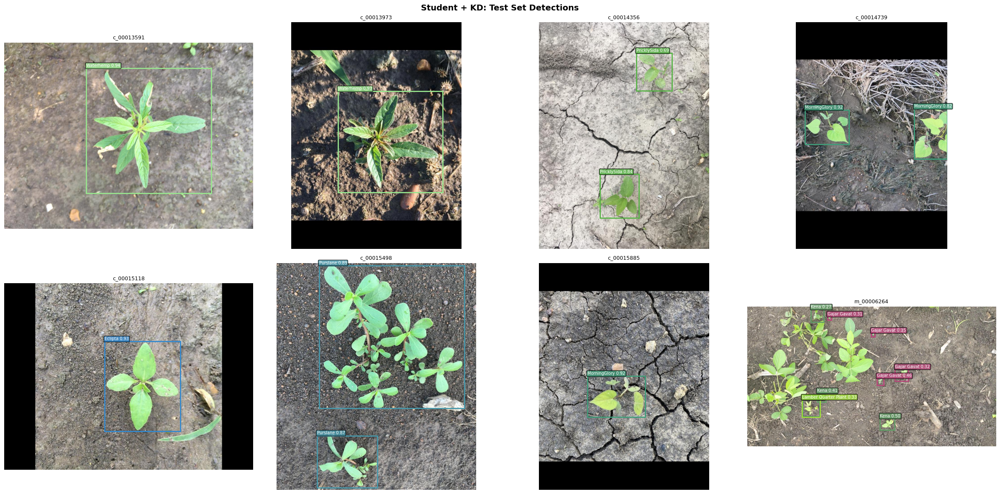

✅ Saved: /kaggle/working/outputs/qualitative_results.png


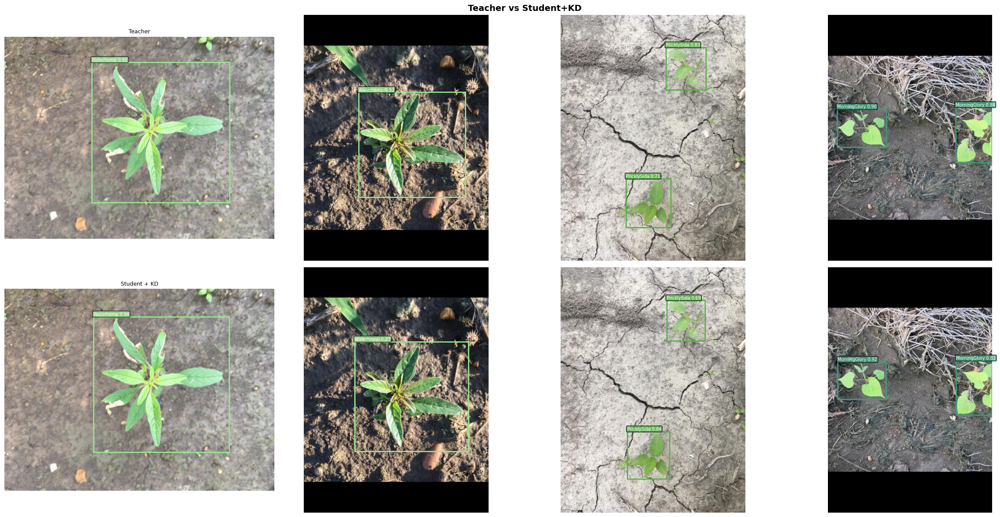

✅ Saved: /kaggle/working/outputs/teacher_vs_student.png

📊 SECTION 4.5: SUMMARY CHARTS


/tmp/ipykernel_24/977262393.py:667: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels([n.replace(' ', '\n') for n in eval_names], fontsize=8)
/tmp/ipykernel_24/977262393.py:677: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[2].set_xticklabels([n.replace(' ', '\n') for n in eval_names], fontsize=8)


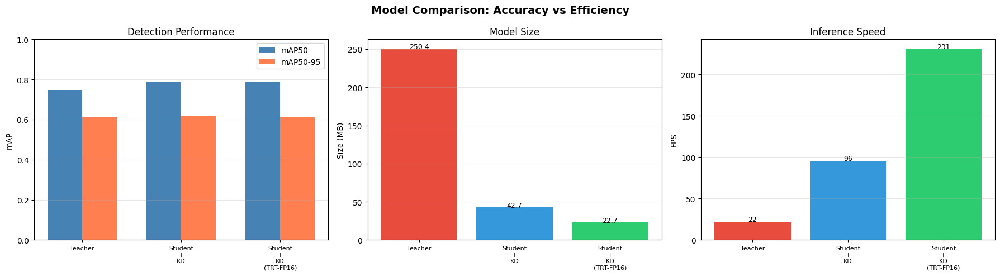

✅ Saved: /kaggle/working/outputs/model_comparison.png

📋 FINAL SUMMARY
  Teacher                        mAP50=0.7466 | 250.4MB | 22 FPS
  Student + KD                   mAP50=0.7881 | 42.7MB | 96 FPS
  Student + KD (TRT-FP16)        mAP50=0.7893 | 22.7MB | 231 FPS

  KD vs Teacher gap:  +4.15% mAP50

✅ All results saved to: /kaggle/working/outputs
✅ JSON: /kaggle/working/outputs/paper_results.json


In [10]:
# ================================================================
# CELL 17: QUANTIZATION + FULL EVALUATION FOR PAPER (FIXED v2)
# ================================================================
import torch
import torch.nn as nn
import time
import numpy as np
import cv2
import yaml
import copy
import json
import shutil
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
from ultralytics import YOLO
from ultralytics.nn.tasks import DetectionModel
from collections import defaultdict

print("="*70)
print("📊 QUANTIZATION + FULL EVALUATION")
print("="*70)

device = 'cuda' if torch.cuda.is_available() else 'cpu'

BEST_KD = Path(KD_STUDENT_WEIGHTS)
assert BEST_KD.exists(), f"KD model not found: {BEST_KD}"

with open(YAML_PATH, 'r') as f:
    data_cfg = yaml.safe_load(f)
NC_NOW = data_cfg['nc']
CLASS_NAMES = data_cfg['names']
if isinstance(CLASS_NAMES, dict):
    CLASS_NAMES = {int(k): v for k, v in CLASS_NAMES.items()}


# ==========================================
# HELPER: Build a deployable YOLO from KD checkpoint
# ==========================================
def build_yolo_from_kd_ckpt(ckpt_path, nc, class_names, device='cuda'):
    print("  Loading checkpoint state...")
    ckpt = torch.load(ckpt_path, map_location='cpu')
    state_dict = ckpt['model'] if 'model' in ckpt else ckpt

    print("  Building YOLOv8s architecture...")
    model = DetectionModel(cfg="yolov8s.yaml", ch=3, nc=nc)

    # Adapt detection head
    print("  Adapting detection head...")
    det = model.model[-1]
    det.nc = nc
    for b in det.cv3:
        old = b[-1]
        new_conv = nn.Conv2d(
            old.in_channels, nc,
            kernel_size=old.kernel_size,
            stride=old.stride,
            padding=old.padding,
            bias=True
        )
        nn.init.normal_(new_conv.weight, 0, 0.01)
        nn.init.constant_(new_conv.bias, -4.5)
        b[-1] = new_conv
    det.no = det.nc + det.reg_max * 4

    # Load weights
    model.load_state_dict(state_dict, strict=True)
    model.nc = nc
    model.names = class_names
    model = model.to(device)
    model.eval()

    # Save model to temporary path
    tmp_path = OUTPUT / 'best_kd_student_deployable.pt'
    
    torch.save({
        'model': model,
        'nc': nc,
        'names': class_names,
        'args': {
            'imgsz': 640, 'batch': 16, 'epochs': 100, 
            'optimizer': 'SGD', 'lr0': 0.01
        }
    }, tmp_path)
    print(f"  Model saved to: {tmp_path}")

    # Wrap with YOLO
    print("  Wrapping with YOLO...")
    yolo_obj = YOLO(str(tmp_path))
    
    # Clean overrides - DO NOT include 'nc' here
    yolo_obj.overrides = {
        'imgsz': 640,
        'task': 'detect',
        'verbose': False
    }

    return yolo_obj, tmp_path


# ==========================================
# STEP 1: LOAD KD STUDENT AS DEPLOYABLE YOLO
# ==========================================
print("\n📦 Loading KD Student...")
student_kd_yolo, deployable_path = build_yolo_from_kd_ckpt(
    BEST_KD, NC_NOW, CLASS_NAMES, device
)
print(f"✅ KD Student loaded: {NC_NOW} classes")

# Save a clean FP32 copy for export
fp32_path = OUTPUT / 'student_fp32_deployable.pt'
shutil.copy2(deployable_path, fp32_path)


# ==========================================
# STEP 2: EXPORT FORMATS
# ==========================================
print("\n" + "="*70)
print("📦 STEP 2: EXPORTING MODELS")
print("="*70)

HAS_FP16_TS  = False
HAS_ONNX     = False
HAS_TRT      = False

# FP16 TorchScript
print("\n🔧 Exporting FP16 TorchScript...")
try:
    fp16_path = student_kd_yolo.export(
        format='torchscript', half=True, imgsz=640
    )
    fp16_path = Path(fp16_path)
    HAS_FP16_TS = True
    print(f"✅ FP16 TorchScript: {fp16_path}")
except Exception as e:
    print(f"⚠ FP16 TorchScript failed: {e}")
    fp16_path = None

# ONNX FP32
print("\n🔧 Exporting ONNX FP32...")
try:
    onnx_path = student_kd_yolo.export(
        format='onnx', imgsz=640, simplify=True, half=False
    )
    onnx_path = Path(onnx_path)
    HAS_ONNX = True
    print(f"✅ ONNX: {onnx_path}")
except Exception as e:
    print(f"⚠ ONNX export failed: {e}")
    onnx_path = None

# TensorRT FP16
print("\n🔧 Trying TensorRT FP16...")
try:
    trt_path = student_kd_yolo.export(
        format='engine', imgsz=640, half=True, device=0
    )
    trt_path = Path(trt_path)
    HAS_TRT = True
    print(f"✅ TensorRT FP16: {trt_path}")
except Exception as e:
    print(f"⚠ TensorRT failed: {e}")
    trt_path = None

# PyTorch Dynamic INT8
print("\n🔧 PyTorch Dynamic INT8 Quantization...")
HAS_PYTORCH_INT8 = False
try:
    # Reload model directly to apply quantization
    ckpt = torch.load(deployable_path, map_location='cpu', weights_only=False)
    q_model = ckpt['model'].cpu().eval()
    
    # Apply dynamic quantization
    q_model_int8 = torch.quantization.quantize_dynamic(
        q_model, {nn.Linear, nn.Conv2d}, dtype=torch.qint8
    )
    
    q_int8_path = OUTPUT / 'student_int8_dynamic.pt'
    torch.save({
        'model': q_model_int8.state_dict(),
        'nc': NC_NOW,
        'names': CLASS_NAMES
    }, q_int8_path)
    print(f"✅ PyTorch Dynamic INT8 saved: {q_int8_path}")
    HAS_PYTORCH_INT8 = True
except Exception as e:
    print(f"⚠ PyTorch INT8 failed: {e}")


# ==========================================
# STEP 3: BUILD ALL MODELS FOR EVALUATION
# ==========================================
print("\n" + "="*70)
print("📦 STEP 3: BUILDING MODELS FOR EVALUATION")
print("="*70)

# Teacher — load and fix nc if needed
def load_teacher_for_eval(weights_path, nc, class_names, device):
    """Load teacher, adapting head to current nc if necessary."""
    try:
        y = YOLO(str(weights_path))
        # Quick nc check
        if y.model.model[-1].nc != nc:
            print(f"  ⚠ Teacher nc={y.model.model[-1].nc}, adapting to {nc}...")
            det = y.model.model[-1]
            det.nc = nc
            for b in det.cv3:
                old = b[-1]
                new_conv = nn.Conv2d(
                    old.in_channels, nc,
                    kernel_size=old.kernel_size,
                    stride=old.stride,
                    padding=old.padding,
                    bias=True
                )
                b[-1] = new_conv
            det.no = det.nc + det.reg_max * 4
        y.model.nc = nc
        y.model.names = class_names
        y.model.to(device).eval()
        return y
    except Exception as e:
        print(f"  ⚠ Teacher load failed: {e}")
        return None

teacher_yolo = load_teacher_for_eval(
    CFG['teacher_weights'], NC_NOW, CLASS_NAMES, device
)

models = {}
if teacher_yolo:
    models['Teacher'] = teacher_yolo
models['Student + KD'] = student_kd_yolo

# Add TRT model if available (Skip efficiency benchmarks for TRT)
trt_model = None
if HAS_TRT:
    try:
        trt_model = YOLO(str(trt_path))
        # Don't add TRT to models dict for parameter counting
        # It will be handled separately in efficiency table
        print(f"✅ TRT Model loaded for evaluation")
    except Exception as e:
        print(f"  ⚠ Could not load TRT model: {e}")

print(f"  Models to evaluate: {list(models.keys())}")


# ==========================================
# SECTION 4.1: DETECTION PERFORMANCE
# ==========================================
print("\n" + "="*70)
print("📊 SECTION 4.1: DETECTION PERFORMANCE")
print("="*70)

results_table = {}

for name, model in models.items():
    print(f"\n  Evaluating: {name}...")
    try:
        r = model.val(
            data=str(YAML_PATH),
            imgsz=640,
            batch=16,
            device=0 if device == 'cuda' else 'cpu',
            verbose=False,
            plots=False
        )
        results_table[name] = {
            'mAP50':     float(r.box.map50),
            'mAP50-95':  float(r.box.map),
            'Precision': float(r.box.mp),
            'Recall':    float(r.box.mr),
        }
        
        # Per-class AP50
        if hasattr(r.box, 'ap_class_index') and hasattr(r.box, 'ap50'):
            per_cls = np.zeros(NC_NOW)
            for i, cls_idx in enumerate(r.box.ap_class_index):
                per_cls[int(cls_idx)] = float(r.box.ap50[i])
            results_table[name]['per_class_ap50'] = per_cls
        elif hasattr(r.box, 'ap50'):
            results_table[name]['per_class_ap50'] = np.array(r.box.ap50)

        print(f"    ✅ mAP50={results_table[name]['mAP50']:.4f} "
              f"mAP50-95={results_table[name]['mAP50-95']:.4f} "
              f"P={results_table[name]['Precision']:.4f} "
              f"R={results_table[name]['Recall']:.4f}")
    except Exception as e:
        print(f"    ⚠ Failed: {e}")
        results_table[name] = {
            'mAP50': 0, 'mAP50-95': 0, 'Precision': 0, 'Recall': 0
        }

# Evaluate TRT model separately
if trt_model is not None:
    print(f"\n  Evaluating: Student + KD (TRT-FP16)...")
    try:
        r = trt_model.val(
            data=str(YAML_PATH),
            imgsz=640,
            batch=16,
            device=0,
            verbose=False,
            plots=False
        )
        results_table['Student + KD (TRT-FP16)'] = {
            'mAP50':     float(r.box.map50),
            'mAP50-95':  float(r.box.map),
            'Precision': float(r.box.mp),
            'Recall':    float(r.box.mr),
        }
        
        if hasattr(r.box, 'ap_class_index') and hasattr(r.box, 'ap50'):
            per_cls = np.zeros(NC_NOW)
            for i, cls_idx in enumerate(r.box.ap_class_index):
                per_cls[int(cls_idx)] = float(r.box.ap50[i])
            results_table['Student + KD (TRT-FP16)']['per_class_ap50'] = per_cls
        elif hasattr(r.box, 'ap50'):
            results_table['Student + KD (TRT-FP16)']['per_class_ap50'] = np.array(r.box.ap50)
            
        print(f"    ✅ mAP50={results_table['Student + KD (TRT-FP16)']['mAP50']:.4f} "
              f"mAP50-95={results_table['Student + KD (TRT-FP16)']['mAP50-95']:.4f}")
    except Exception as e:
        print(f"    ⚠ TRT Eval failed: {e}")

# Summary table
print(f"\n{'='*80}")
print(f"{'Model':<30} {'mAP50':>8} {'mAP50-95':>10} {'Precision':>10} {'Recall':>8}")
print(f"{'-'*80}")
for name, m in results_table.items():
    print(f"{name:<30} {m['mAP50']:>8.4f} {m['mAP50-95']:>10.4f} "
          f"{m['Precision']:>10.4f} {m['Recall']:>8.4f}")
print(f"{'='*80}")

# Per-class AP50
print(f"\n📊 Per-Class AP50:")
header = f"{'Class':<25}"
for name in results_table:
    header += f" {name[:15]:>15}"
print(header)
print("-" * (25 + 16 * len(results_table)))
for cls_id in range(NC_NOW):
    cls_name = CLASS_NAMES.get(cls_id, f"class_{cls_id}")
    row = f"{cls_name:<25}"
    for name, m in results_table.items():
        if 'per_class_ap50' in m and cls_id < len(m['per_class_ap50']):
            row += f" {float(m['per_class_ap50'][cls_id]):>15.4f}"
        else:
            row += f" {'N/A':>15}"
    print(row)


# ==========================================
# SECTION 4.2: MODEL EFFICIENCY
# ==========================================
print("\n" + "="*70)
print("📊 SECTION 4.2: MODEL EFFICIENCY ANALYSIS")
print("="*70)

def get_model_size_mb(path):
    p = Path(path)
    return p.stat().st_size / (1024 * 1024) if p.exists() else 0.0

def benchmark_fps(model, device, n_warmup=10, n_runs=50):
    # Use normalized input (0-1) to avoid warnings
    dummy = torch.randn(1, 3, 640, 640).to(device) / 255.0
    
    for _ in range(n_warmup):
        try:
            # Predict with tensor directly
            with torch.no_grad():
                _ = model.model(dummy)
        except Exception:
            # Fallback to YOLO predict
            try:
                model.predict(source=dummy, verbose=False, device=device)
            except Exception:
                return 0.0, 0.0
    
    times = []
    for _ in range(n_runs):
        if device == 'cuda':
            torch.cuda.synchronize()
        t0 = time.perf_counter()
        
        try:
            with torch.no_grad():
                _ = model.model(dummy)
        except Exception:
            try:
                model.predict(source=dummy, verbose=False, device=device)
            except Exception:
                return 0.0, 0.0
                
        if device == 'cuda':
            torch.cuda.synchronize()
        times.append(time.perf_counter() - t0)
    
    avg_ms = float(np.mean(times)) * 1000
    return avg_ms, 1000.0 / avg_ms if avg_ms > 0 else 0.0

model_paths = {
    'Teacher':          CFG['teacher_weights'],
    'Student + KD':     fp32_path,
}
if HAS_FP16_TS and fp16_path:
    model_paths['Student + KD (FP16-TS)'] = fp16_path
if HAS_ONNX and onnx_path:
    model_paths['Student + KD (ONNX)'] = onnx_path
if HAS_TRT and trt_path:
    model_paths['Student + KD (TRT-FP16)'] = trt_path

efficiency_table = {}

# Only benchmark PyTorch models (Teacher and Student + KD)
for name, model in models.items():
    try:
        # Check if model has valid .model attribute with parameters
        if hasattr(model, 'model') and hasattr(model.model, 'parameters'):
            params = sum(p.numel() for p in model.model.parameters())
        else:
            params = 0
    except Exception:
        params = 0
        
    size_mb = get_model_size_mb(model_paths.get(name, ''))
    avg_ms, fps = benchmark_fps(model, device)
    efficiency_table[name] = {
        'Params (M)':    params / 1e6,
        'Size (MB)':     size_mb,
        'Latency (ms)':  avg_ms,
        'FPS':           fps,
    }
    print(f"  {name}: {params/1e6:.1f}M params | {size_mb:.1f}MB | {avg_ms:.1f}ms | {fps:.1f} FPS")

# Add TRT model manually (no params, no FPS from this loop)
if HAS_TRT and trt_path:
    # Get FPS for TRT separately
    trt_avg_ms, trt_fps = 0.0, 0.0
    if trt_model is not None:
        try:
            # Benchmark TRT
            dummy = torch.randn(1, 3, 640, 640).to(device) / 255.0
            for _ in range(10):
                trt_model.predict(source=dummy, verbose=False, device=device)
            times = []
            for _ in range(50):
                if device == 'cuda':
                    torch.cuda.synchronize()
                t0 = time.perf_counter()
                trt_model.predict(source=dummy, verbose=False, device=device)
                if device == 'cuda':
                    torch.cuda.synchronize()
                times.append(time.perf_counter() - t0)
            trt_avg_ms = float(np.mean(times)) * 1000
            trt_fps = 1000.0 / trt_avg_ms if trt_avg_ms > 0 else 0.0
        except Exception as e:
            print(f"  ⚠ TRT benchmark failed: {e}")
    
    efficiency_table['Student + KD (TRT-FP16)'] = {
        'Params (M)':   efficiency_table.get('Student + KD', {}).get('Params (M)', 0),
        'Size (MB)':    get_model_size_mb(trt_path),
        'Latency (ms)': trt_avg_ms,
        'FPS':          trt_fps,
    }

# Add exported model sizes (no FPS)
for name, path in model_paths.items():
    if name not in efficiency_table:
        efficiency_table[name] = {
            'Params (M)':   efficiency_table.get('Student + KD', {}).get('Params (M)', 0),
            'Size (MB)':    get_model_size_mb(path),
            'Latency (ms)': 0,
            'FPS':          0,
        }

print(f"\n{'='*85}")
print(f"{'Model':<32} {'Params(M)':>10} {'Size(MB)':>10} {'Latency(ms)':>12} {'FPS':>8}")
print(f"{'-'*85}")
for name, m in efficiency_table.items():
    print(f"{name:<32} {m['Params (M)']:>10.1f} {m['Size (MB)']:>10.1f} "
          f"{m['Latency (ms)']:>12.1f} {m['FPS']:>8.1f}")
print(f"{'='*85}")

if 'Teacher' in efficiency_table and 'Student + KD' in efficiency_table:
    t_size = efficiency_table['Teacher']['Size (MB)']
    s_size = efficiency_table['Student + KD']['Size (MB)']
    t_fps  = efficiency_table['Teacher']['FPS']
    s_fps  = efficiency_table['Student + KD']['FPS']
    if s_size > 0:
        print(f"\n📊 Size ratio:   {t_size/s_size:.2f}x")
    if t_fps > 0:
        print(f"📊 Speed ratio:  {s_fps/t_fps:.2f}x")


# ==========================================
# SECTION 4.3: ABLATION STUDY
# ==========================================
print("\n" + "="*70)
print("📊 SECTION 4.3: ABLATION STUDY")
print("="*70)

ablation_data = []

def ablation_row(config, kd, feat, quant, model_key, eff_key=None):
    ek = eff_key or model_key
    return {
        'Config':        config,
        'KD':            kd,
        'Feature KD':    feat,
        'Quantization':  quant,
        'mAP50':         results_table.get(model_key, {}).get('mAP50', 0),
        'mAP50-95':      results_table.get(model_key, {}).get('mAP50-95', 0),
        'Size (MB)':     efficiency_table.get(ek, {}).get('Size (MB)', 0),
        'FPS':           efficiency_table.get(ek, {}).get('FPS', 0),
    }

ablation_data.append(ablation_row('Teacher (Ref)', '-', '-', 'FP32', 'Teacher'))
ablation_data.append(ablation_row('Student + KD',  '✓', '✓', 'FP32', 'Student + KD'))
if HAS_FP16_TS:
    ablation_data.append(ablation_row(
        'Student+KD+FP16', '✓', '✓', 'FP16',
        'Student + KD', 'Student + KD (FP16-TS)'
    ))
if HAS_TRT:
    ablation_data.append(ablation_row(
        'Student+KD+TRT', '✓', '✓', 'TRT-FP16',
        'Student + KD (TRT-FP16)'
    ))

print(f"\n{'='*100}")
print(f"{'Config':<25} {'KD':>4} {'Feat':>5} {'Quant':>8} "
      f"{'mAP50':>8} {'mAP50-95':>10} {'Size(MB)':>10} {'FPS':>8}")
print(f"{'-'*100}")
for row in ablation_data:
    print(f"{row['Config']:<25} {row['KD']:>4} {row['Feature KD']:>5} "
          f"{row['Quantization']:>8} {row['mAP50']:>8.4f} {row['mAP50-95']:>10.4f} "
          f"{row['Size (MB)']:>10.1f} {row['FPS']:>8.1f}")
print(f"{'='*100}")


# ==========================================
# SECTION 4.4: QUALITATIVE RESULTS
# ==========================================
print("\n" + "="*70)
print("📊 SECTION 4.4: QUALITATIVE RESULTS")
print("="*70)

test_img_dir = MERGED / 'test' / 'images'
test_images  = sorted(
    list(test_img_dir.glob('*.jpg')) +
    list(test_img_dir.glob('*.jpeg')) +
    list(test_img_dir.glob('*.png'))
)

N_SAMPLES = 8
step = max(1, len(test_images) // N_SAMPLES)
sample_images = test_images[::step][:N_SAMPLES]
print(f"  Using {len(sample_images)} test images")

np.random.seed(42)
colors = {i: tuple(int(c) for c in np.random.randint(50, 230, 3)) for i in range(NC_NOW)}

def draw_predictions(ax, img_bgr, results_obj, class_names, colors, title=""):
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)
    if results_obj and results_obj[0].boxes is not None:
        for box in results_obj[0].boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            cls_id  = int(box.cls[0].cpu())
            conf    = float(box.conf[0].cpu())
            name_   = class_names.get(cls_id, f"cls_{cls_id}")
            color_f = [c / 255.0 for c in colors.get(cls_id, (255, 0, 0))]
            rect = patches.Rectangle(
                (x1, y1), x2 - x1, y2 - y1,
                linewidth=2, edgecolor=color_f, facecolor='none'
            )
            ax.add_patch(rect)
            ax.text(x1, max(y1 - 5, 0), f"{name_} {conf:.2f}",
                    color='white', fontsize=7,
                    bbox=dict(boxstyle='round,pad=0.2',
                              facecolor=color_f, alpha=0.8))
    ax.set_title(title, fontsize=9)
    ax.axis('off')

# Grid: KD student on 8 images
fig, axes = plt.subplots(2, 4, figsize=(24, 12))
for idx, img_path in enumerate(sample_images):
    img = cv2.imread(str(img_path))
    if img is None:
        continue
    r = student_kd_yolo.predict(
        source=str(img_path), imgsz=640, conf=0.25,
        device=device, verbose=False
    )
    draw_predictions(axes.flatten()[idx], img, r,
                     CLASS_NAMES, colors, img_path.stem[:20])

plt.suptitle("Student + KD: Test Set Detections", fontsize=14, fontweight='bold')
plt.tight_layout()
out_q = OUTPUT / 'qualitative_results.png'
plt.savefig(out_q, dpi=150, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {out_q}")

# Teacher vs Student side-by-side (first 4 images)
if 'Teacher' in models:
    fig, axes = plt.subplots(2, 4, figsize=(24, 12))
    for col, img_path in enumerate(sample_images[:4]):
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        for row, (mname, mobj) in enumerate([
            ('Teacher', models['Teacher']),
            ('Student + KD', models['Student + KD'])
        ]):
            r = mobj.predict(
                source=str(img_path), imgsz=640, conf=0.25,
                device=device, verbose=False
            )
            draw_predictions(
                axes[row][col], img, r, CLASS_NAMES, colors,
                mname if col == 0 else ""
            )
    plt.suptitle("Teacher vs Student+KD", fontsize=14, fontweight='bold')
    plt.tight_layout()
    out_cmp = OUTPUT / 'teacher_vs_student.png'
    plt.savefig(out_cmp, dpi=150, bbox_inches='tight')
    plt.show()
    print(f"✅ Saved: {out_cmp}")


# ==========================================
# SECTION 4.5: SUMMARY CHARTS
# ==========================================
print("\n" + "="*70)
print("📊 SECTION 4.5: SUMMARY CHARTS")
print("="*70)

eval_names  = list(results_table.keys())
map50_vals  = [results_table[n]['mAP50']     for n in eval_names]
map95_vals  = [results_table[n]['mAP50-95']  for n in eval_names]
size_vals   = [efficiency_table.get(n, {}).get('Size (MB)', 0) for n in eval_names]
fps_vals    = [efficiency_table.get(n, {}).get('FPS', 0)       for n in eval_names]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
x = np.arange(len(eval_names))
w = 0.35
palette = ['#e74c3c', '#3498db', '#2ecc71', '#f39c12'][:len(eval_names)]

# mAP
axes[0].bar(x - w/2, map50_vals,  w, label='mAP50',    color='steelblue')
axes[0].bar(x + w/2, map95_vals,  w, label='mAP50-95', color='coral')
axes[0].set_ylabel('mAP')
axes[0].set_title('Detection Performance')
axes[0].set_xticks(x)
axes[0].set_xticklabels([n.replace(' ', '\n') for n in eval_names], fontsize=8)
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)
axes[0].set_ylim(0, 1.0)

# Size
bars = axes[1].bar(eval_names, size_vals, color=palette)
axes[1].set_ylabel('Size (MB)')
axes[1].set_title('Model Size')
axes[1].set_xticklabels([n.replace(' ', '\n') for n in eval_names], fontsize=8)
for b, v in zip(bars, size_vals):
    axes[1].text(b.get_x() + b.get_width()/2, b.get_height() + 0.3,
                 f'{v:.1f}', ha='center', fontsize=9)
axes[1].grid(axis='y', alpha=0.3)

# FPS
bars = axes[2].bar(eval_names, fps_vals, color=palette)
axes[2].set_ylabel('FPS')
axes[2].set_title('Inference Speed')
axes[2].set_xticklabels([n.replace(' ', '\n') for n in eval_names], fontsize=8)
for b, v in zip(bars, fps_vals):
    axes[2].text(b.get_x() + b.get_width()/2, b.get_height() + 0.3,
                 f'{v:.0f}', ha='center', fontsize=9)
axes[2].grid(axis='y', alpha=0.3)

plt.suptitle("Model Comparison: Accuracy vs Efficiency",
             fontsize=14, fontweight='bold')
plt.tight_layout()
out_chart = OUTPUT / 'model_comparison.png'
plt.savefig(out_chart, dpi=150, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {out_chart}")


# ==========================================
# FINAL SUMMARY
# ==========================================
print("\n" + "="*70)
print("📋 FINAL SUMMARY")
print("="*70)

for name, m in results_table.items():
    e = efficiency_table.get(name, {})
    print(f"  {name:<30} mAP50={m['mAP50']:.4f} | "
          f"{e.get('Size (MB)', 0):.1f}MB | {e.get('FPS', 0):.0f} FPS")

if 'Teacher' in results_table and 'Student + KD' in results_table:
    t_map = results_table['Teacher']['mAP50']
    s_map = results_table['Student + KD']['mAP50']
    print(f"\n  KD vs Teacher gap:  {(s_map - t_map)*100:+.2f}% mAP50")

# Save JSON for paper
paper_results = {
    'detection_performance': {
        k: {kk: (vv.tolist() if isinstance(vv, np.ndarray) else vv)
            for kk, vv in v.items()}
        for k, v in results_table.items()
    },
    'efficiency': {
        k: {kk: float(vv) for kk, vv in v.items()}
        for k, v in efficiency_table.items()
    },
    'ablation': ablation_data,
    'num_classes': NC_NOW,
    'class_names': CLASS_NAMES,
}
json_path = OUTPUT / 'paper_results.json'
with open(json_path, 'w') as f:
    json.dump(paper_results, f, indent=2, default=str)
print(f"\n✅ All results saved to: {OUTPUT}")
print(f"✅ JSON: {json_path}")